In [ ]:
!pip install transformers datasets torch scikit-learn evaluate kagglehub

In [ ]:
import kagglehub

# Download latest version
dataset_path = kagglehub.dataset_download("rmisra/news-headlines-dataset-for-sarcasm-detection")

print("Path to dataset files:", dataset_path)

100%|██████████| 3.30M/3.30M [00:00<00:00, 76.2MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/rmisra/news-headlines-dataset-for-sarcasm-detection/versions/2


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/MyDrive/cs4248/

bert-uncased-finetuned.zip  explain_using_lime.json  temp.json
explain_using_ig.json	    explain_using_tcav.json  val_random_sarcastic.txt


In [ ]:
!mkdir -p /content/cs4248-project
%cd /content/cs4248-project

!unzip -q "/content/drive/MyDrive/cs4248/bert-uncased-finetuned.zip" -d /content/cs4248-project/

/content/cs4248-project


In [ ]:
!mv bert-base-uncased-24-finepruned-sarcasm-detection weight

In [ ]:
!pwd

/content


In [ ]:
!ls

weight


In [ ]:
from transformers import BertForSequenceClassification, BertTokenizerFast, AutoConfig
import torch

In [ ]:
model_directory="/content/cs4248-project/weight"

In [ ]:
tokenizer = BertTokenizerFast.from_pretrained(model_directory)
print("Tokenizer loaded successfully.")

Tokenizer loaded successfully.


In [ ]:
config = AutoConfig.from_pretrained(model_directory, num_labels=2) # Set num_labels according to your task
print("Configuration loaded successfully.")

Configuration loaded successfully.


In [ ]:
model = BertForSequenceClassification.from_pretrained(model_directory, config=config)
print("Model loaded successfully from SafeTensors.")

Model loaded successfully from SafeTensors.


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print(f"Model moved to: {device}")

Model moved to: cpu


In [ ]:
model.eval()
def predict(texts):
  inputs = tokenizer(texts, return_tensors="pt", padding=True)
  outputs = model(**inputs)
  return outputs.logits.argmax(dim=1)

In [ ]:
print(predict(["hello world"]))
print(predict(["thirtysomething scientists unveil doomsday clock of hair loss"]))

tensor([0])
tensor([1])


In [ ]:
def get_prediction(text):
  result_tensor = predict(text)
  result_array = result_tensor.cpu().numpy()
  return "Sarcastic" if result_array[0] == 1 else "Not Sarcastic"

print(get_prediction("hello world"))
print(get_prediction("thirtysomething scientists unveil doomsday clock of hair loss"))

Not Sarcastic
Sarcastic


# Dataset

In [ ]:
import kagglehub

# Download latest version
dataset_path = kagglehub.dataset_download("rmisra/news-headlines-dataset-for-sarcasm-detection")

print("Path to dataset files:", dataset_path)

Path to dataset files: /kaggle/input/news-headlines-dataset-for-sarcasm-detection


In [ ]:
import pandas as pd
path = f"{dataset_path}/Sarcasm_Headlines_Dataset_v2.json"
df = pd.read_json(path, lines=True)
df.iloc[0]["article_link"]

'https://www.theonion.com/thirtysomething-scientists-unveil-doomsday-clock-of-hai-1819586205'

# Explain using Lime

In [ ]:
# Install LIME if not already installed
!pip install lime

# Import necessary libraries
import lime
import lime.lime_text
import numpy as np
import torch
from tqdm.auto import tqdm

In [ ]:
model.eval()
def getProb(texts):
  inputs = tokenizer(texts, return_tensors="pt", padding=True)
  outputs = model(**inputs)
  probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
  return probs.detach().numpy()

In [ ]:
print(getProb("hello world"))
print(getProb("thirtysomething scientists unveil doomsday clock of hair loss"))

[[9.991405e-01 8.594339e-04]]
[[0.00933292 0.99066705]]


In [ ]:
explainer = lime.lime_text.LimeTextExplainer(class_names=["Not Sarcastic", "Sarcastic"])

examples = df["headline"].tolist()[:5]  # Just take a few examples

In [ ]:
from IPython.display import display, HTML
def explain_using_lime(text,plot=False):
   # Get prediction from our BERT model
    pred = getProb([text])[0]
    predicted_class = np.argmax(pred)
    class_name = "Sarcastic" if predicted_class == 1 else "Not Sarcastic"
   # Get LIME explanation
    exp = explainer.explain_instance(
        text,
        getProb,
        num_features=6,
        num_samples=100
    )
    if plot:
      with open("exp.html","w") as f:
        f.write(exp.as_html())
      display(HTML(exp.as_html()))

    # Display explanation
    print("Explanation:")
    #(np.str_('scientists'), 0.2970193544477877)
    exps = exp.as_list()
    exps = [(name.item(), weight) for name, weight in exps]
    obj = {"text": text, "prediction": class_name, "explanation": exps}
    return obj


In [ ]:
# visualize
text = "sun thinking of just collapsing now and getting this all over with"
print(f"Explaining '{text}' with LIME\n")
explain_using_lime(text,plot=True)

Explaining 'sun thinking of just collapsing now and getting this all over with' with LIME



Explanation:


{'text': 'sun thinking of just collapsing now and getting this all over with',
 'prediction': 'Sarcastic',
 'explanation': [('sun', 0.5503165712254704),
  ('and', -0.23713219192495033),
  ('collapsing', 0.22663857492572198),
  ('over', 0.12717268514638966),
  ('thinking', 0.11968201923287819),
  ('all', -0.11480851477750771)]}


Example 1: thirtysomething scientists unveil doomsday clock of hair loss


Explanation:
{'text': 'thirtysomething scientists unveil doomsday clock of hair loss', 'prediction': 'Sarcastic', 'explanation': [('unveil', 0.20596063306732834), ('clock', 0.18801526770946334), ('scientists', 0.178007612449623), ('thirtysomething', 0.1456568820931895), ('of', 0.13474782290754841), ('loss', -0.08397725255415217)]}

Example 2: dem rep. totally nails why congress is falling short on gender, racial equality


Explanation:
{'text': 'dem rep. totally nails why congress is falling short on gender, racial equality', 'prediction': 'Not Sarcastic', 'explanation': [('why', -0.0643249119628594), ('equality', -0.06143963985936788), ('gender', -0.05839108058124181), ('is', -0.047181054696363585), ('rep', 0.04279130270556125), ('racial', -0.034487547264953414)]}

Example 3: eat your veggies: 9 deliciously different recipes


Explanation:
{'text': 'eat your veggies: 9 deliciously different recipes', 'prediction': 'Not Sarcastic', 'explanation': [('recipes', -0.05498765745773382), ('veggies', -0.04280948845747159), ('9', -0.03180571443974599), ('eat', -0.029525443058930474), ('deliciously', 0.018145219621709743), ('your', 0.006202109921449765)]}

Example 4: inclement weather prevents liar from getting to work


Explanation:
{'text': 'inclement weather prevents liar from getting to work', 'prediction': 'Sarcastic', 'explanation': [('weather', 0.11306167893938364), ('liar', 0.09741329921296656), ('inclement', 0.09256442640113345), ('to', 0.08177245090284266), ('getting', 0.04167376494182632), ('prevents', 0.02815717620735801)]}

Example 5: mother comes pretty close to using word 'streaming' correctly


Explanation:
{'text': "mother comes pretty close to using word 'streaming' correctly", 'prediction': 'Sarcastic', 'explanation': [('word', 0.28974625903337164), ('pretty', 0.21228198201838053), ('mother', 0.21104234715695164), ('to', -0.15006936901869272), ('comes', 0.09539171800628828), ('correctly', -0.035922546198524245)]}


# Anchor

In [ ]:
# https://github.com/marcotcr/anchor/blob/master/notebooks/Anchor%20for%20text.ipynb

# Install Anchor if not already installed
!pip install anchor-exp

# Import necessary libraries
import numpy as np
import torch
from anchor import anchor_text

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.3/427.3 kB 7.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for anchor-exp: filename=anchor_exp-0.0.2.0-py3-none-any.whl size=433502 sha256=bdb268b1a38d8f468521e946af18314905477dabf4eeada8ee8ccc2e5527e486
  Stored in directory: /root/.cache/pip/wheels/02/f9/94/c51254cde228ec1397f5c2dafb60bacab62c53159f000857fe
Successfully built anchor-exp


In [ ]:
import spacy

nlp = spacy.load('en_core_web_sm')

In [ ]:
explainer = anchor_text.AnchorText(
    nlp,
    ['Not Sarcastic', 'Sarcastic'],
    use_unk_distribution=False
)

examples = df["headline"].tolist()[:10]  # Get 10 examples

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/465 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/263M [00:00<?, ?B/s]

In [ ]:
def predict_new(texts):
  """
  Predicts sarcasm labels for a list of texts.

  Args:
    texts: A list of strings.

  Returns:
    A NumPy array of predicted labels (0 for Not Sarcastic, 1 for Sarcastic).
  """
  # Tokenize inputs and move them to the model's device
  inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True) # Added truncation=True as good practice
  inputs = {k: v.to(device) for k, v in inputs.items()}

  # Perform inference without calculating gradients
  with torch.no_grad():
      outputs = model(**inputs)

  # Get the predicted class indices (argmax)
  predictions = outputs.logits.argmax(dim=1)

  # Move predictions to CPU (if necessary) and convert to NumPy array
  results = predictions.cpu().numpy()
  print(results)
  return results


In [ ]:
for idx, text in enumerate(examples):
    print(f"\n\n===== Example {idx+1}: =====")
    print(f"Text: {text}")

    # Get model prediction
    pred = predict_new([text])[0]
    print(f"Prediction: {'Sarcastic' if pred == 1 else 'Not Sarcastic'}")

    # Get Anchor explanation
    anchor_exp = explainer.explain_instance(
        text,
        predict_new,
        threshold=0.5
    )

    # Display the Anchor explanation
    print(f"\nAnchor: {anchor_exp.names()}")
    print(f"Precision: {anchor_exp.precision():.4f}")
    print(f"Coverage: {anchor_exp.coverage():.4f}")

    # Show examples where anchor applies
    print("\nExamples where anchor applies:")
    for example, label in anchor_exp.examples(only_same=True)[:2]:
        print(f"  - {example} (Predicted: {'Sarcastic' if label else 'Not Sarcastic'})")

    # Show examples where anchor doesn't apply
    print("\nExamples where anchor doesn't apply:")
    for example, label in anchor_exp.examples(only_different=True)[:2]:
        print(f"  - {example} (Predicted: {'Sarcastic' if label else 'Not Sarcastic'})")



===== Example 1: =====
Text: thirtysomething scientists unveil doomsday clock of hair loss
[1]
Prediction: Sarcastic
[1]
[0]
[1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0 1 0 1 0 0 0 0 0 1]
[0 0 0 0 1 0 0 0 0 0]
[0 0 1 0 0 1 1 0 0 0]
[0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 1 0 0]
[0 0 0 0 0 0 1 0 0 0]
[0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 1 1]
[0 1 0 0 0 1 0 0 0 0]
[1 0 0 0 0 0 0 0 1 0]
[1 1 1 0 0 0 0 0 0 0]
[0 0 1 1 0 1 0 1 0 0]
[0 0 0 0 0 0 0 0 1 0]
[0 0 0 0 0 0 0 0 0 0]
[0 0 1 0 0 0 1 0 0 0]
[0 0 0 0 0 0 0 0 1 0]
[0 0 0 0 0 1 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0]
[0 0 1 0 0 1 0 0 0 1]
[0 0 0 0 0 1 0 1 0 0]
[0 1 0 0 1 0 0 0 0 0]
[0 0 0 0 1 0 0 0 0 0]
[0 0 1 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 1 0]
[0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 1 0 0 0]
[0 0 0 1 1 0 1 0 1 0]
[0 0 0 0 0 0 0 0 0 0]
[1 0 0 1 0 0 0 0 1 0]
[0 0 0 0 0 0 0 0 0 1]
[0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 1 0 0 1 0 0]
[0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 1 0]
[0 1 0 0 0 0 0 0 0 1]
[1 0 

#Interpretability Beyond Feature Attribution: Quantitative Testing with Concept Activation Vectors (TCAV)

In [ ]:
!unzip -q "/content/drive/MyDrive/cs4248/concepts.zip" -d /content/cs4248-project/

replace /content/cs4248-project/concepts/mocking_authority.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/cs4248-project/concepts/personification_anthropomorphism.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/cs4248-project/concepts/political_satire.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: a
error:  invalid response [a]
replace /content/cs4248-project/concepts/political_satire.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: All


In [ ]:
%cd /content/cs4248-project
!ls ./concepts

/content/cs4248-project
absurdity.txt			   mocking_corporations.txt
all_results.json		   personification_anthropomorphism.txt
critique_of_media_consumerism.txt  playing_on_stereotypes.txt
dark_humor.txt			   political_satire.txt
everyday_banality.txt		   random_non_sarcastic.txt
exaggeration.txt		   random_sarcastic.txt
failure_disappointment.txt	   self-deprecation.txt
juxtaposition.txt		   taboo_subjects.txt
low_expectations.txt		   understatement.txt
mocking_authority.txt		   weird_news.txt
mocking_celebrities.txt


In [ ]:
import torch
import os
from transformers import AutoModelForSequenceClassification, AutoTokenizer # Assuming HF Transformers
from torch.utils.data import Dataset, DataLoader
from captum.concept import Concept, TCAV
from captum.attr import LayerGradientXActivation
from sklearn.linear_model import SGDClassifier
import glob
import warnings
import logging
import torch.nn.functional as F
import random
import matplotlib.pyplot as plt


model_directory = "/content/cs4248-project/weight"
tokenizer = BertTokenizerFast.from_pretrained(model_directory)
config = AutoConfig.from_pretrained(model_directory, num_labels=2)
model = BertForSequenceClassification.from_pretrained(model_directory, config=config)
model = BertForSequenceClassification.from_pretrained(model_directory, config=config)
model.eval()
dataset_path = kagglehub.dataset_download("rmisra/news-headlines-dataset-for-sarcasm-detection")
path = f"{dataset_path}/Sarcasm_Headlines_Dataset_v2.json"
df = pd.read_json(path, lines=True)
df.iloc[0]["article_link"]
# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
# Suppress specific warnings if needed (e.g., from sklearn)
warnings.filterwarnings("ignore", category=UserWarning, module='sklearn')


# --- Add this section after loading the DataFrame 'df' ---
NUM_RANDOM_SAMPLES = 10 # Number of samples for each random concept
# Use the CONCEPTS_DIR defined earlier
RANDOM_CONCEPTS_DIR = CONCEPTS_DIR

# Ensure the concepts directory exists
os.makedirs(RANDOM_CONCEPTS_DIR, exist_ok=True)

# Get all headlines if df is loaded
if 'df' in locals() and not df.empty:
    all_headlines = df['headline'].tolist()

    if len(all_headlines) > 0:
        # Create random_sarcastic concept file
        # Sample min(NUM_RANDOM_SAMPLES, len(all_headlines)) to avoid errors if dataset is smaller
        num_samples_sarcastic = min(NUM_RANDOM_SAMPLES, len(all_headlines))
        random_sarcastic_samples = random.sample(all_headlines, num_samples_sarcastic)
        random_sarcastic_path = os.path.join(RANDOM_CONCEPTS_DIR, "random_sarcastic.txt")
        with open(random_sarcastic_path, 'w', encoding='utf-8') as f:
            for line in random_sarcastic_samples:
                f.write(line + '\n')
        logging.info(f"Created random concept file: {random_sarcastic_path} with {len(random_sarcastic_samples)} samples.")

        # Create random_non_sarcastic concept file (using different random samples)
        num_samples_non_sarcastic = min(NUM_RANDOM_SAMPLES, len(all_headlines))
        # Re-sample to get a different set for the second file
        random_non_sarcastic_samples = random.sample(all_headlines, num_samples_non_sarcastic)
        random_non_sarcastic_path = os.path.join(RANDOM_CONCEPTS_DIR, "random_non_sarcastic.txt")
        with open(random_non_sarcastic_path, 'w', encoding='utf-8') as f:
            for line in random_non_sarcastic_samples:
                f.write(line + '\n')
        logging.info(f"Created random concept file: {random_non_sarcastic_path} with {len(random_non_sarcastic_samples)} samples.")
    else:
        logging.warning("DataFrame 'df' is empty or 'headline' column not found. Cannot create random concept files.")
else:
    logging.warning("DataFrame 'df' not loaded. Cannot create random concept files.")
# --- End of added section ---


# --- Configuration ---
# <<< --- START --- >>>
# <<< Specify your Hugging Face model name here >>>
MODEL_NAME = "bert-base-uncased"
# MODEL_NAME = "distilbert-base-uncased-finetuned-sst-2-english" # Example alternative
# <<< Specify the directory containing your concept files (.txt) >>>
CONCEPTS_DIR = "./concepts"
# <<< Specify where to save TCAV results (activations, CAVs) >>>
# SAVE_PATH = "./tcav_results" # Removed as saving is not required
# <<< Specify the names of the layers you want to analyze >>>
# Example: Layer before classification head in BERT. Adjust based on your model structure.
# Use print(model) to inspect layer names if unsure.
TARGET_LAYER_NAMES = ["bert.pooler.dense"]
# Example for DistilBERT: ["pre_classifier"]
# Example for deeper layer: ["bert.encoder.layer.11.output.dense"]
# <<< --- END --- >>>

BATCH_SIZE = 16 # For concept dataloaders and interpretation inputs
MAX_LENGTH = 128 # Tokenizer max length

# --- Helper Functions ---

class TextDataset(Dataset):
    """Simple Dataset for text lines from a file."""
    def __init__(self, file_path, tokenizer, max_length):
        self.tokenizer = tokenizer
        self.max_length = max_length
        try:
            with open(file_path, 'r', encoding='utf-8') as f:
                self.texts = [line.strip() for line in f if line.strip()]
            if not self.texts:
                logging.warning(f"Concept file is empty: {file_path}")
        except FileNotFoundError:
            logging.error(f"Concept file not found: {file_path}")
            self.texts = []
        except Exception as e:
            logging.error(f"Error reading concept file {file_path}: {e}")
            self.texts = []

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        # Tokenize and ensure PyTorch tensors
        inputs = self.tokenizer(
            text,
            return_tensors='pt',
            max_length=self.max_length,
            padding='max_length',
            truncation=True
        )
        # Remove the batch dimension added by the tokenizer
        return {key: val.squeeze(0) for key, val in inputs.items()}

def load_concepts(concepts_dir, tokenizer, max_length, batch_size, min_examples=10):
    """Loads concepts from text files in a directory."""
    concepts = []
    concept_files = glob.glob(os.path.join(concepts_dir, "*.txt"))
    if not concept_files:
        raise ValueError(f"No concept files (.txt) found in {concepts_dir}")

    logging.info(f"Found concept files: {concept_files}")

    for i, file_path in enumerate(sorted(concept_files)): # Sort for consistent IDs
        concept_name = os.path.splitext(os.path.basename(file_path))[0]
        dataset = TextDataset(file_path, tokenizer, max_length)

        if len(dataset) < min_examples:
            logging.warning(
                f"Skipping concept '{concept_name}' from {file_path} "
                f"due to insufficient examples ({len(dataset)} < {min_examples})."
            )
            continue

        # This collate function prepares batches for the model's forward pass
        # It needs to match what Captum expects when extracting activations.
        # Returning a tuple matching the model's forward args is required here.
        def collate_fn(batch):
            input_ids = torch.stack([item['input_ids'] for item in batch])
            attention_mask = torch.stack([item['attention_mask'] for item in batch])
            # Include token_type_ids if the model uses them (e.g., BERT)
            token_type_ids = None
            if 'token_type_ids' in batch[0]:
                 token_type_ids = torch.stack([item['token_type_ids'] for item in batch])

            # Return a tuple in the order expected by model.forward
            # (input_ids, attention_mask, token_type_ids, ...)
            # Adjust if your specific model expects a different order or args.
            if token_type_ids is not None:
                return (input_ids, attention_mask, token_type_ids)
            else:
                # If model doesn't use/need token_type_ids, just return the required ones
                return (input_ids, attention_mask)

        # Important: drop_last=True can prevent errors if the last batch is smaller
        # than what the classifier expects, especially with parallel processing.
        data_iter = DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn, drop_last=True)

        concepts.append(Concept(id=i, name=concept_name, data_iter=data_iter))
        logging.info(f"Loaded concept: '{concept_name}' (ID: {i}) with {len(dataset)} examples from {file_path}")

    if not concepts:
         raise ValueError(f"Could not load any valid concepts from {concepts_dir}")

    return concepts

def get_layer_from_name(model, layer_name):
    """Helper to get a layer module object from its string name."""
    try:
        # Split the name and traverse the model attributes
        layers = layer_name.split('.')
        module = model
        for layer in layers:
            module = getattr(module, layer)
        return module
    except AttributeError:
        logging.error(f"Layer '{layer_name}' not found in model.")
        # You could print available layer names here for debugging:
        # for name, _ in model.named_modules(): print(name)
        return None
    except Exception as e:
        logging.error(f"Error accessing layer {layer_name}: {e}")
        return None


# --- Main Script ---


"""Runs the TCAV analysis."""
# Define a wrapper for the model's forward pass to return only logits
def forward_wrapper(*args, **kwargs):
    # Remove potential 'output_attentions' and 'output_hidden_states' if Captum adds them
    kwargs.pop('output_attentions', None)
    kwargs.pop('output_hidden_states', None)
    # Ensure inputs are on the correct device
    args = tuple(arg.to(device) if isinstance(arg, torch.Tensor) else arg for arg in args)
    kwargs = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in kwargs.items()}

    output = model(*args, **kwargs)
    # Extract logits from the output object
    if hasattr(output, 'logits'):
        return output.logits
    else:
        # Fallback if the output is already logits (less likely for SeqClassification)
        return output

# --- Add this function definition somewhere after helper functions ---

def interpret_single_sample(text_sample, mytcav_instance, tokenizer, device, all_concepts, target_class, max_len):
    """Tokenizes a single text sample and runs TCAV interpretation against multiple concept sets."""
    logging.info(f"\n--- Interpreting Single Sample ---")
    logging.info(f"Text: {text_sample}")

    # 1. Tokenize the single sample
    inputs_tokenized = tokenizer(
        [text_sample], # Pass as a list to maintain batch dimension
        return_tensors='pt',
        max_length=max_len,
        padding='max_length',
        truncation=True
    )

    # 2. Move to device
    inputs_tokenized = {key: val.to(device) for key, val in inputs_tokenized.items()}

    # 3. Prepare inputs and additional args for interpret
    interpret_inputs = inputs_tokenized['input_ids'] # Shape: [1, seq_len]
    interpret_add_args = []
    if 'attention_mask' in inputs_tokenized:
        interpret_add_args.append(inputs_tokenized['attention_mask']) # Shape: [1, seq_len]
    # else:
    #     interpret_add_args.append(None) # Captum might handle None differently, safer to omit if not present

    if 'token_type_ids' in inputs_tokenized:
        interpret_add_args.append(inputs_tokenized['token_type_ids']) # Shape: [1, seq_len]

    interpret_add_args = tuple(interpret_add_args) if interpret_add_args else None

    # Find the random concepts
    random_sarcastic_concept = next((c for c in all_concepts if c.name == "random_sarcastic"), None)
    random_non_sarcastic_concept = next((c for c in all_concepts if c.name == "random_non_sarcastic"), None)

    if not random_sarcastic_concept or not random_non_sarcastic_concept:
        logging.error("Could not find 'random_sarcastic' or 'random_non_sarcastic' concepts. Ensure the .txt files exist and were loaded.")
        return

    # Define the experimental sets: one set for each non-random concept paired with the random ones
    # single_sample_experimental_sets = [] # Removed - process one set at a time
    original_concepts = [c for c in all_concepts if c.name not in ["random_sarcastic", "random_non_sarcastic"]]

    # Concepts known to cause errors
    skip_concepts = {"juxtaposition", "low_expectations", "playing_on_stereotypes", "self-deprecation"}

    if not original_concepts:
        logging.warning("No non-random concepts found to create experimental sets.")
        return

    # Store results for visualization
    results_for_plot = {}

    # 4. Run interpretation (inside the loop now)
    print(f"\n--- TCAV Results for Sample: '{text_sample[:50]}...' ---")
    print(f"Target Class: {target_class}")

    for original_concept in original_concepts:
        if original_concept.name in skip_concepts:
            logging.info(f"Skipping known problematic concept: {original_concept.name}")
            continue

        print(f"\nProcessing concept: {original_concept.name} (ID: {original_concept.id})")
        current_experimental_set = [original_concept, random_sarcastic_concept, random_non_sarcastic_concept]

        try:
            # Interpret with only the current experimental set
            single_tcav_scores = mytcav_instance.interpret(
                inputs=interpret_inputs,
                experimental_sets=[current_experimental_set], # Pass as a list with one set
                target=target_class,
                additional_forward_args=interpret_add_args
            )

            # 5. Print results for the current set
            # The score dictionary key might be complex; let's assume it's consistent or just grab the first key
            set_key = list(single_tcav_scores.keys())[0]
            layer_scores = single_tcav_scores[set_key]

            concept_names_in_set = "-".join([c.name for c in current_experimental_set])
            print(f"Experimental Set: {concept_names_in_set} (Key: {set_key})")

            for layer_name, scores in layer_scores.items():
                print(f"  Layer: {layer_name}")
                concepts_in_this_set = current_experimental_set
                sign_count = scores.get('sign_count')
                magnitude = scores.get('magnitude')
                random_counterparts = scores.get('random_counterparts') # Check if random scores are returned
                if magnitude is not None:
                    print(f"    Magnitude Score:")
                    for j, concept in enumerate(concepts_in_this_set):
                        score_val = magnitude[0, j].item() if magnitude.dim() == 2 else magnitude[j].item()
                        print(f"      - {concept.name}: {score_val:.4f}")
                        # Store the score for the original concept for plotting
                        if j == 0: # The original concept is always first in our set
                            results_for_plot[original_concept.name] = score_val

                # Print TCAV significance score if available (calculated using random counterparts)
                if random_counterparts is not None and sign_count is not None:
                    concept_index = 0 # Assuming the original concept is the first in the set
                    tcav_score = mytcav_instance.get_sensitivity_results(concepts_in_this_set[concept_index].name, random_sarcastic_concept.name, scores)

                    print(f"    TCAV Significance (vs {random_sarcastic_concept.name}):")
                    if tcav_score:
                         print(f"      - {concepts_in_this_set[concept_index].name}: p-val={tcav_score.get('p-val', 'N/A'):.3f}, acc={tcav_score.get('acc', 'N/A'):.3f}")
                    else:
                         print(f"      - Could not calculate sensitivity for {concepts_in_this_set[concept_index].name}")

        except Exception as e:
            logging.error(f"Error during interpretation for concept '{original_concept.name}': {e}", exc_info=False) # exc_info=False to avoid redundant traceback
            # Decide whether to continue or stop
            continue # Uncommented to try interpreting subsequent concepts
            # break # Commented out - Stop processing further concepts on error

    # --- Add Visualization --- (after the loop)
    if results_for_plot:
        concept_names = list(results_for_plot.keys())
        scores = list(results_for_plot.values())

        fig, ax = plt.subplots(figsize=(10, max(6, len(concept_names) * 0.5))) # Adjust height based on number of concepts
        bars = ax.barh(concept_names, scores, color=['red' if s < 0 else 'blue' for s in scores])
        ax.set_xlabel('TCAV Magnitude Score')
        ax.set_ylabel('Concept')
        ax.set_title(f'Concept Importance for: "{text_sample[:60]}..." (Target: {target_class})')
        ax.axvline(0, color='grey', linewidth=0.8)

        # Add labels to bars
        ax.bar_label(bars, fmt='%.3f', padding=3)

        plt.tight_layout()
        plt.show()
    else:
        logging.warning("No successful concept results to plot.")


# --- Example call in the main script execution part ---

# 1. Load Model and Tokenizer
logging.info(f"Loading model and tokenizer: {MODEL_NAME}")
# Verify target layers exist and get module objects
logging.info(f"Verifying target layers: {TARGET_LAYER_NAMES}")
# Keep this verification loop to ensure names are valid
valid_layer_names = []
for layer_name in TARGET_LAYER_NAMES:
    layer_module = get_layer_from_name(model, layer_name)
    if layer_module is not None:
        valid_layer_names.append(layer_name) # Store the valid name
    else:
        logging.warning(f"Could not find layer: {layer_name}, skipping.")

if not valid_layer_names:
    raise ValueError("No valid target layers found. Please check TARGET_LAYER_NAMES.")

# 2. Load Concepts
logging.info(f"\nLoading concepts from: {CONCEPTS_DIR}")
concepts = load_concepts(CONCEPTS_DIR, tokenizer, MAX_LENGTH, BATCH_SIZE, min_examples=10)
# 3. Initialize TCAV - Pass the list of layer NAMES
#    and configure the attribution method to use the wrapper
logging.info(f"\nInitializing TCAV for layers: {valid_layer_names}")

# Explicitly create the default attribution method but with our wrapper
# Layer will be set internally by TCAV for each layer in valid_layer_names
layer_attrib = LayerGradientXActivation(forward_func=forward_wrapper, layer=None)

mytcav = TCAV(model=model, # TCAV still needs the model for activation generation
                layers=valid_layer_names, # Pass the list of layer names (strings)
                layer_attr_method=layer_attrib) # Pass our configured attribution method


# Example: Pick one sarcastic and one non-sarcastic sample
sample_to_interpret_sarcastic = df[df['is_sarcastic'] == 1]['headline'].iloc[0]
sample_to_interpret_non_sarcastic = df[df['is_sarcastic'] == 0]['headline'].iloc[0]

# Pass the full 'concepts' list to the function now
interpret_single_sample(sample_to_interpret_sarcastic, mytcav, tokenizer, device, concepts, target_class=1, max_len=MAX_LENGTH) # Assuming target=1 for sarcasm
interpret_single_sample(sample_to_interpret_non_sarcastic, mytcav, tokenizer, device, concepts, target_class=0, max_len=MAX_LENGTH) # Assuming target=0 for non-sarcasm


NameError: name 'CONCEPTS_DIR' is not defined

In [ ]:
def explain_with_tcav(text_sample):
    prediction = get_prediction(text_sample)
    obj = {"text":text_sample, "prediction":prediction}
    global mytcav, tokenizer, device, concepts,MAX_LENGTH
    all_concepts = concepts
    target_class = 1
    inputs_tokenized = tokenizer(
          [text_sample],
          return_tensors='pt',
          max_length=MAX_LENGTH,
          padding='max_length',
          truncation=True
      )
    inputs_tokenized = {key: val.to(device) for key, val in inputs_tokenized.items()}
    interpret_inputs = inputs_tokenized['input_ids'] # Shape: [1, seq_len]
    interpret_add_args = []
    if 'attention_mask' in inputs_tokenized:
        interpret_add_args.append(inputs_tokenized['attention_mask']) # Shape: [1, seq_len]
    # else:
    #     interpret_add_args.append(None) # Captum might handle None differently, safer to omit if not present

    if 'token_type_ids' in inputs_tokenized:
        interpret_add_args.append(inputs_tokenized['token_type_ids']) # Shape: [1, seq_len]

    interpret_add_args = tuple(interpret_add_args) if interpret_add_args else None

    random_sarcastic_concept = next((c for c in all_concepts if c.name == "random_sarcastic"), None)
    random_non_sarcastic_concept = next((c for c in all_concepts if c.name == "random_non_sarcastic"), None)

    if not random_sarcastic_concept or not random_non_sarcastic_concept:
        logging.error("Could not find 'random_sarcastic' or 'random_non_sarcastic' concepts. Ensure the .txt files exist and were loaded.")
        return
    skip_concepts = {"random_sarcastic", "random_non_sarcastic", "juxtaposition", "low_expectations", "playing_on_stereotypes", "self-deprecation"}
    original_concepts = [c for c in all_concepts if c.name not in skip_concepts]
    exps = []
    for original_concept in original_concepts:
      current_experimental_set = [original_concept, random_sarcastic_concept, random_non_sarcastic_concept]

      # Interpret with only the current experimental set
      single_tcav_scores = mytcav.interpret(
          inputs=interpret_inputs,
          experimental_sets=[current_experimental_set], # Pass as a list with one set
          target=target_class,
          additional_forward_args=interpret_add_args
      )

      # 5. Print results for the current set
      # The score dictionary key might be complex; let's assume it's consistent or just grab the first key
      set_key = list(single_tcav_scores.keys())[0]
      layer_scores = single_tcav_scores[set_key]
      _exps = []
      for layer_name, scores in layer_scores.items():
          concepts_in_this_set = current_experimental_set
          magnitude = scores.get('magnitude')
          if magnitude is not None:
              for j, concept in enumerate(concepts_in_this_set):
                  score_val = magnitude[0, j].item() if magnitude.dim() == 2 else magnitude[j].item()
                  _exps.append((concept.name, score_val))
      exps.append(_exps)
      obj['explanation'] = exps

    return obj

data = explain_with_tcav("hello world")
print(data)

{'text': 'hello world', 'prediction': 'Not Sarcastic', 'explanation': [[('absurdity', -0.007613170892000198), ('random_sarcastic', 0.017474167048931122), ('random_non_sarcastic', -0.008661072701215744)], [('critique_of_media_consumerism', 0.07397086173295975), ('random_sarcastic', -0.03140159323811531), ('random_non_sarcastic', -0.05839568004012108)], [('dark_humor', -0.02215568721294403), ('random_sarcastic', -0.04351675137877464), ('random_non_sarcastic', 0.07086887955665588)], [('everyday_banality', -0.05267978459596634), ('random_sarcastic', 0.12435077130794525), ('random_non_sarcastic', -0.061352282762527466)], [('exaggeration', -0.055296219885349274), ('random_sarcastic', 0.10777074098587036), ('random_non_sarcastic', -0.02890864759683609)], [('failure_disappointment', -0.016341418027877808), ('random_sarcastic', 0.03418894484639168), ('random_non_sarcastic', -0.049403462558984756)], [('mocking_authority', -0.0729890838265419), ('random_sarcastic', 0.15479612350463867), ('random_

#Gradient based


In [ ]:
#https://captum.ai/tutorials/Bert_SQUAD_Interpret2

In [ ]:
!pip install torch captum transformers pandas matplotlib seaborn tqdm kagglehub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 52.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.


In [ ]:
"""
BERT Model Interpretation for Sarcasm Detection

This script uses Captum to interpret a pre-loaded BERT sarcasm detection model.
It assumes the model, tokenizer, and device variables are already defined in the environment.
"""
import os
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List, Dict, Any, Tuple
import random

# Import Captum for interpretability
from captum.attr import LayerIntegratedGradients, visualization as viz
from captum.attr import LayerConductance, IntegratedGradients

# Define forward function for interpretability
def sarcasm_forward_func(inputs, token_type_ids=None, position_ids=None, attention_mask=None):
    """Forward function for attribution analysis, returns sarcasm score (class 1)"""
    # Check if inputs are embeddings or token ids
    if inputs.dim() == 3:  # [batch_size, seq_len, hidden_dim]
        # Inputs are embeddings
        output = model(inputs_embeds=inputs, token_type_ids=token_type_ids,
                    position_ids=position_ids, attention_mask=attention_mask)
    else:
        # Inputs are token ids
        output = model(inputs, token_type_ids=token_type_ids,
                    position_ids=position_ids, attention_mask=attention_mask)

    # Get the logits
    if hasattr(output, 'logits'):
        logits = output.logits
    else:
        logits = output

    # Return score for sarcasm class (index 1)
    return logits[:, 1]

# Helper function to summarize attributions
def summarize_attributions(attributions):
    """Summarize attributions by summing across embedding dimension"""
    attributions = attributions.sum(dim=-1).squeeze(0)
    attributions = attributions / torch.norm(attributions)
    return attributions

# Function to construct input reference pair
def construct_input_ref_pair(text, tokenizer, device):
    """Construct input and reference token ids for interpretation"""
    text_ids = tokenizer(text, return_tensors="pt", padding=True, truncation=True)

    # Move to device
    input_ids = text_ids['input_ids'].to(device)
    token_type_ids = text_ids['token_type_ids'].to(device) if 'token_type_ids' in text_ids else None
    attention_mask = text_ids['attention_mask'].to(device)

    # Create a reference filled with pad token id
    ref_input_ids = torch.ones_like(input_ids) * tokenizer.pad_token_id
    ref_token_type_ids = torch.zeros_like(token_type_ids) if token_type_ids is not None else None

    return input_ids, ref_input_ids, token_type_ids, ref_token_type_ids, attention_mask, text_ids

# Function to visualize attributions
def visualize_attributions(attributions, tokens, pred_score, pred_class, true_class=None, delta=None):
    """Visualize token attributions"""
    # Filter out special tokens
    special_tokens = ['[CLS]', '[SEP]', '[PAD]']
    filtered_tokens = []
    filtered_attrs = []
    for token, attr in zip(tokens, attributions):
        if token not in special_tokens:
            filtered_tokens.append(token)
            filtered_attrs.append(attr.item()) # Convert tensor to scalar

    # Convert filtered attributions to a tensor if needed, or handle as a list
    # For viz.VisualizationDataRecord, it expects a tensor or list of numbers.
    # Let's use the list of scalars we created.
    if not filtered_tokens: # Avoid errors if all tokens are special tokens
        print("Warning: No content tokens left after filtering special tokens.")
        return

    # Convert filtered_attrs back to a tensor for the record if required by viz
    # Note: viz.VisualizationDataRecord can often handle lists directly
    # Depending on the exact Captum version/requirements, this might need adjustment
    filtered_attrs_tensor = torch.tensor(filtered_attrs, device=attributions.device)

    # Convert attributions to visualization format using filtered data
    vis_data = viz.VisualizationDataRecord(
        filtered_attrs_tensor, # Use filtered attributions
        pred_score,
        pred_class,
        pred_class, # Using pred_class for attribution label as before
        str(true_class) if true_class is not None else "",
        filtered_attrs_tensor.sum(), # Sum of filtered attributions
        filtered_tokens, # Use filtered tokens
        delta # Convergence delta remains the same
    )

    # Print visualization
    print('\n Visualized attributions:')
    viz.visualize_text([vis_data])

# Function to analyze a single sample
def analyze_sample(text, label=None):
    """Analyze a single text sample and visualize attributions"""
    # Prepare inputs
    input_ids, ref_input_ids, token_type_ids, ref_token_type_ids, attention_mask, text_ids = construct_input_ref_pair(text, tokenizer, device)

    # Get tokens for visualization
    tokens = tokenizer.convert_ids_to_tokens(input_ids[0])

    # Get model prediction
    with torch.no_grad():
        outputs = model(input_ids, token_type_ids=token_type_ids, attention_mask=attention_mask)
        if hasattr(outputs, 'logits'):
            logits = outputs.logits
        else:
            logits = outputs

        probs = torch.nn.functional.softmax(logits, dim=-1)
        pred_class = torch.argmax(probs, dim=-1).item()
        pred_score = probs[0, pred_class].item()

    print(f"\nText: {text}")
    print(f"Predicted class: {'Sarcastic' if pred_class == 1 else 'Not sarcastic'} (probability: {pred_score:.4f})")
    if label is not None:
        print(f"True class: {'Sarcastic' if label == 1 else 'Not sarcastic'}")

    # Initialize LayerIntegratedGradients
    lig = LayerIntegratedGradients(sarcasm_forward_func, model.bert.embeddings)

    # Compute attributions
    attributions, delta = lig.attribute(
        inputs=input_ids,
        baselines=ref_input_ids,
        additional_forward_args=(token_type_ids, None, attention_mask),
        return_convergence_delta=True
    )

    # Summarize attributions
    attributions_sum = summarize_attributions(attributions)

    # Visualize attributions
    visualize_attributions(attributions_sum, tokens, pred_score, pred_class, true_class=label, delta=delta)

    return attributions, tokens, pred_class, pred_score

# Function to analyze a layer
def analyze_layer(text, layer_idx):
    """Analyze attributions for a specific layer"""
    # Prepare inputs
    input_ids, ref_input_ids, token_type_ids, ref_token_type_ids, attention_mask, text_ids = construct_input_ref_pair(text, tokenizer, device)

    # Get tokens for visualization
    tokens = tokenizer.convert_ids_to_tokens(input_ids[0])

    # Initialize LayerConductance for the specific layer
    layer = model.bert.encoder.layer[layer_idx]
    lc = LayerConductance(sarcasm_forward_func, layer)

    # Get embedding outputs to use as inputs for layer conductance
    input_embeddings = model.bert.embeddings(input_ids, token_type_ids=token_type_ids)
    ref_input_embeddings = model.bert.embeddings(ref_input_ids, token_type_ids=ref_token_type_ids)

    # Compute attributions - ensure attention mask is correctly passed
    # LayerConductance might return just attributions or (attributions, delta)
    layer_conductance_output = lc.attribute(
        inputs=input_embeddings,
        baselines=ref_input_embeddings,
        additional_forward_args=(token_type_ids, None, attention_mask)
    )

    # Extract attributions (handle tuple output if necessary)
    if isinstance(layer_conductance_output, tuple):
        attributions = layer_conductance_output[0]
    else:
        attributions = layer_conductance_output

    # Summarize attributions
    attributions_sum = summarize_attributions(attributions)
    attributions_sum_np = attributions_sum.cpu().detach().numpy()

    # Filter out special tokens before plotting
    special_tokens = ['[CLS]', '[SEP]', '[PAD]']
    filtered_indices = [i for i, token in enumerate(tokens) if token not in special_tokens]
    filtered_tokens = [tokens[i] for i in filtered_indices]

    if not filtered_tokens:
        print(f"Warning: No content tokens left after filtering for Layer {layer_idx}.")
        # Return unfiltered raw attributions and original tokens if needed, or handle error
        return attributions, tokens

    filtered_attributions_sum_np = attributions_sum_np[filtered_indices]

    # Plot attributions for this layer using filtered data
    plt.figure(figsize=(max(10, len(filtered_tokens)*0.6), 5)) # Dynamic width
    plt.bar(range(len(filtered_tokens)), filtered_attributions_sum_np)
    plt.xticks(range(len(filtered_tokens)), filtered_tokens, rotation=90)
    plt.title(f"Layer {layer_idx} Attributions (Content Tokens Only)")
    plt.ylabel("Attribution Score")
    plt.tight_layout()
    plt.show()

    # Return the raw, unfiltered attributions and original tokens,
    # as analyze_all_layers expects the full set for its own filtering logic before heatmap
    return attributions, tokens # Return original full attributions for heatmap processing

# Function to analyze all layers
def analyze_all_layers(text):
    """Analyze attributions across all layers"""
    # Prepare inputs
    input_ids, ref_input_ids, token_type_ids, ref_token_type_ids, attention_mask, text_ids = construct_input_ref_pair(text, tokenizer, device)

    # Get tokens for visualization
    tokens = tokenizer.convert_ids_to_tokens(input_ids[0])

    # Store attributions for all layers
    layer_attrs_list = []

    # Iterate through all layers
    layer_indices = list(range(model.config.num_hidden_layers))
    print(f"Analyzing {len(layer_indices)} layers...")

    for i in layer_indices:
        # Get attributions for this layer
        # Ensure analyze_layer returns the necessary structure, assuming attr[0] is the tensor
        attr, _ = analyze_layer(text, i)
        # Summarize attributions - check if attr[0] is correct based on analyze_layer output
        if isinstance(attr, tuple): # If analyze_layer returns tuple (attributions, delta)
            attr_sum = summarize_attributions(attr[0])
        else: # If it returns just attributions tensor
             attr_sum = summarize_attributions(attr)

        layer_attrs_list.append(attr_sum.cpu().detach().numpy())

    # Convert list of layer attributions to a 2D numpy array
    layer_attrs_np = np.array(layer_attrs_list)

    # Filter out special tokens and corresponding attributions
    special_tokens = ['[CLS]', '[SEP]', '[PAD]']
    filtered_indices = [i for i, token in enumerate(tokens) if token not in special_tokens]
    filtered_tokens = [tokens[i] for i in filtered_indices]

    if not filtered_tokens:
        print("Warning: No content tokens left after filtering special tokens for layer analysis.")
        return [], [] # Return empty lists if no content

    # Filter columns of the attribution array
    filtered_layer_attrs_np = layer_attrs_np[:, filtered_indices]

    # Create heatmap for all layers using filtered data
    plt.figure(figsize=(max(15, len(filtered_tokens)), max(5, len(layer_indices) / 2))) # Adjust size
    sns.heatmap(
        filtered_layer_attrs_np, # Use filtered attributions
        xticklabels=filtered_tokens, # Use filtered tokens
        yticklabels=layer_indices,
        linewidth=0.2,
        cmap="coolwarm"
    )
    plt.xlabel('Tokens')
    plt.ylabel('Layers')
    plt.title('Token Attribution Across All Layers (Content Tokens Only)')
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    # Return the filtered versions if needed elsewhere
    return filtered_layer_attrs_np, filtered_tokens

# Function to download sample data if not already present
def ensure_data_loaded():
    """Make sure we have access to the sarcasm dataset"""
    global df  # Use global variable to match existing setup

    try:
        # Check if df is already defined
        if 'df' in globals():
            print(f"Using existing dataset with {len(df)} samples")
            return df
    except:
        pass

    # If not, try to load it
    try:
        import kagglehub
        print("Downloading dataset...")
        dataset_path = kagglehub.dataset_download("rmisra/news-headlines-dataset-for-sarcasm-detection")
        path = f"{dataset_path}/Sarcasm_Headlines_Dataset_v2.json"
        df = pd.read_json(path, lines=True)
        print(f"Dataset loaded with {len(df)} samples")
        return df
    except:
        # Fallback to a simple dataset
        print("Creating a simple dataset for demo purposes")
        data = {
            'headline': [
                "mom starting to fear son's web series closest thing she will have to grandchild",
                "area man smoking like he's been to fucking war or something",
                "report: only 47,000 social justice milestones to go before u.s. achieves full equality",
                "former versace store clerk sues over secret 'black code' for minority shoppers",
                "j.k. rowling wishes snape happy birthday in the most magical way",
                "the 'roseanne' revival catches up to our thorny political mood, for better and worse"
            ],
            'is_sarcastic': [1, 1, 1, 0, 0, 0]
        }
        df = pd.DataFrame(data)
        print(f"Created simple dataset with {len(df)} samples")
        return df


"""Run interpretability analysis on the pre-loaded model"""
# Ensure we have a dataset
df = ensure_data_loaded()

# Ensure the global variables are accessible
global model, tokenizer, device

print(f"Using model: {type(model).__name__} on {device}")

# Analyze a few examples from each class
print("\n=== Analyzing individual examples ===")
sarcastic_samples = df[df['is_sarcastic'] == 1]['headline'].sample(3).tolist()
non_sarcastic_samples = df[df['is_sarcastic'] == 0]['headline'].sample(3).tolist()

for text in sarcastic_samples:
    analyze_sample(text, label=1)

for text in non_sarcastic_samples:
    analyze_sample(text, label=0)

# Pick a specific example for detailed layer analysis
detailed_example = sarcastic_samples[0]

# Analyze key layers for this example
print("\n=== Layer-by-layer analysis ===")
layer_attrs, tokens = analyze_all_layers(detailed_example)

print("\nInterpretability analysis complete.")



Using existing dataset with 28619 samples
Using model: BertForSequenceClassification on cpu

=== Analyzing individual examples ===

Text: experts warn transitioning too quickly from work to vacation could cause decompression sickness
Predicted class: Sarcastic (probability: 0.9995)
True class: Sarcastic


KeyboardInterrupt: 


Text: sun thinking of just collapsing now and getting this all over with
Predicted class: Sarcastic (probability: 0.9991)
True class: Sarcastic

 Visualized attributions:


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
1,1 (1.00),1,-0.42,sun thinking of just collapsing now and getting this all over with


Analyzing 12 layers...


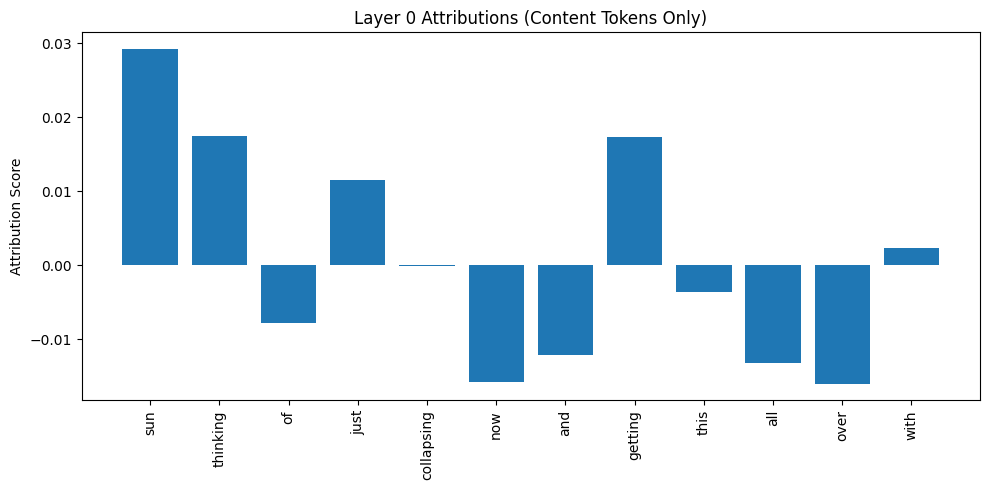

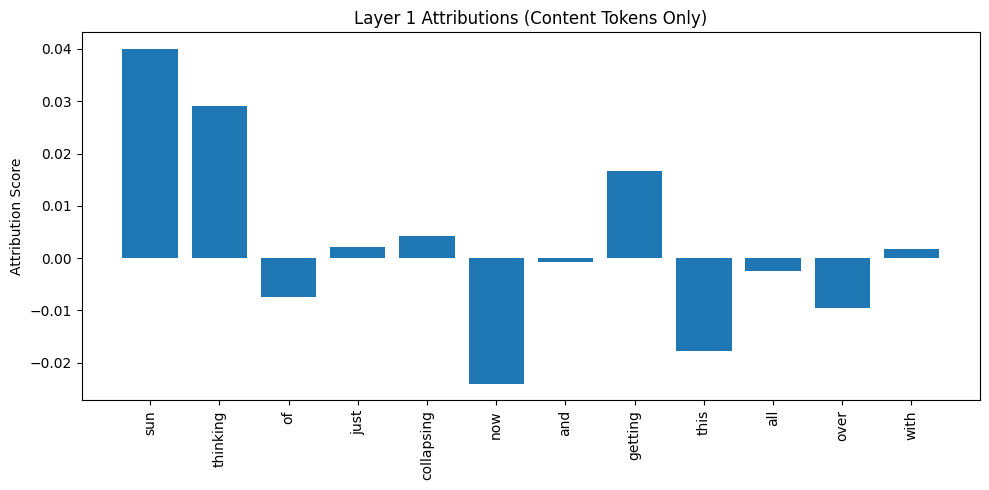

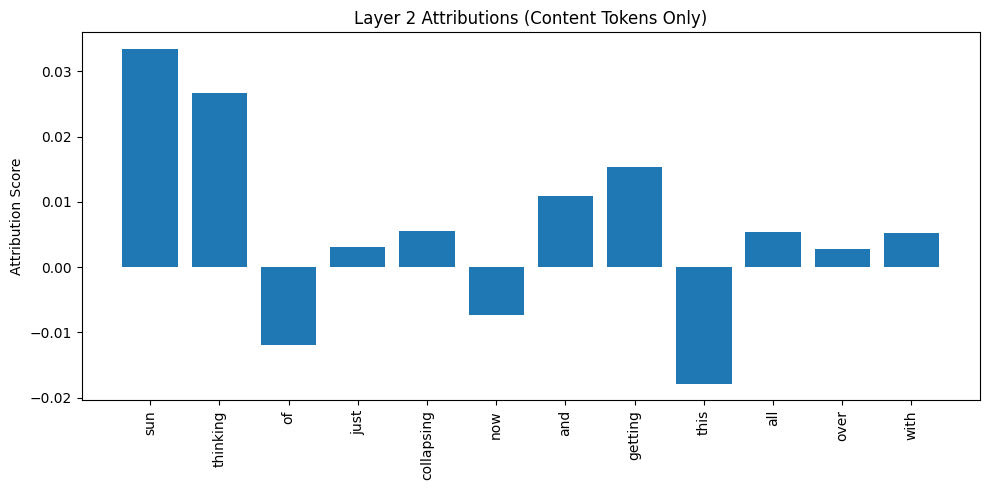

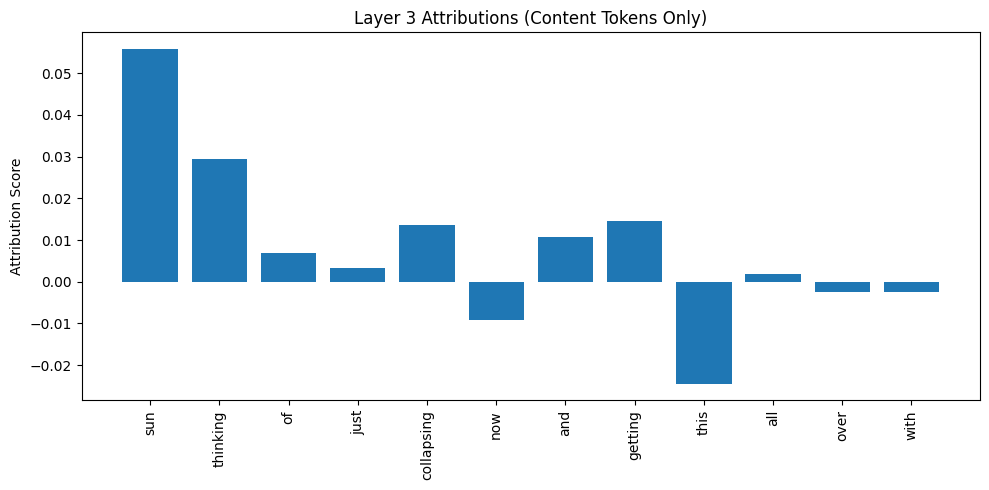

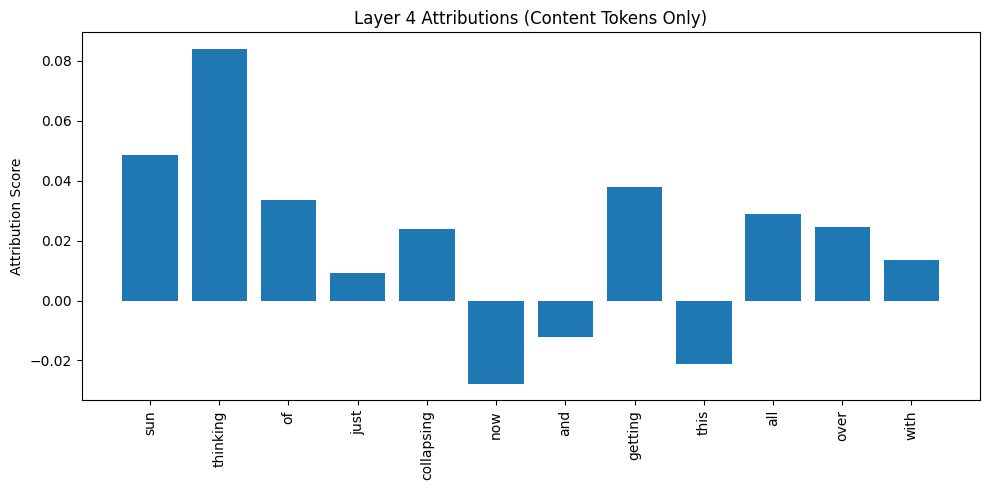

...

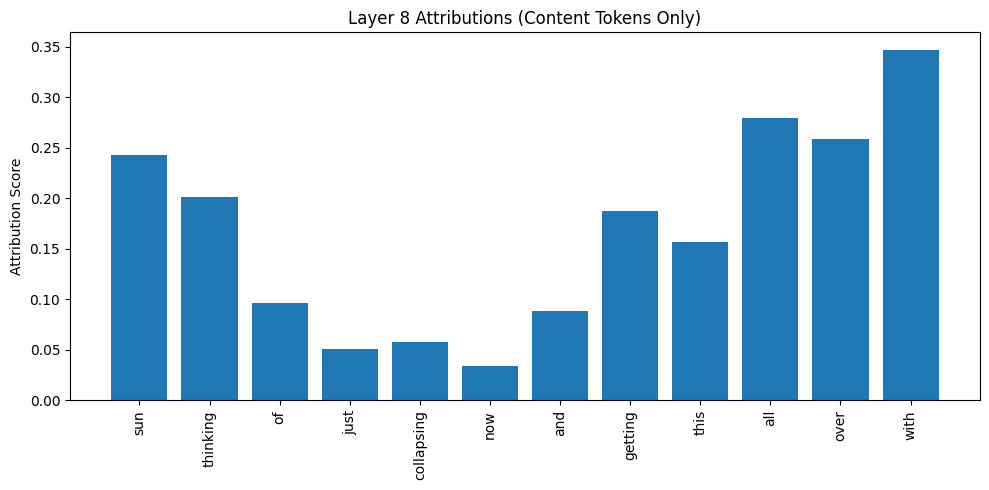

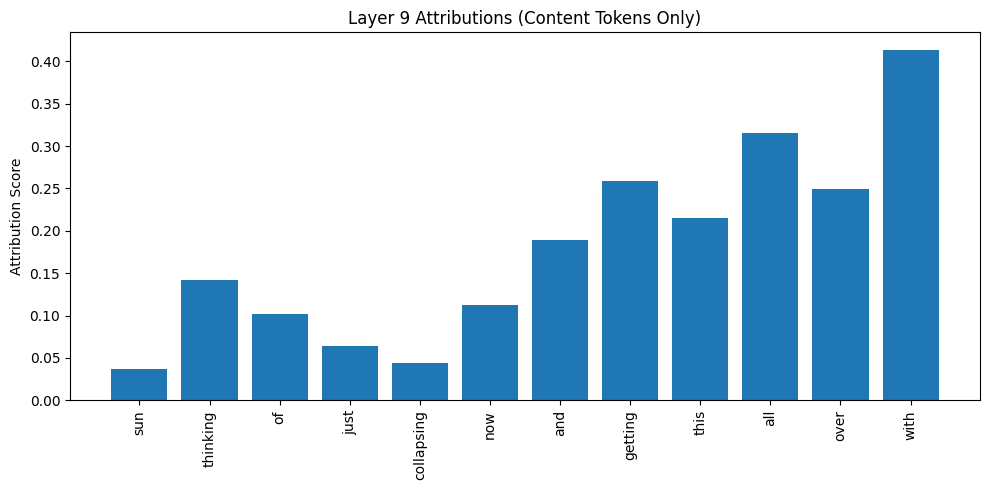

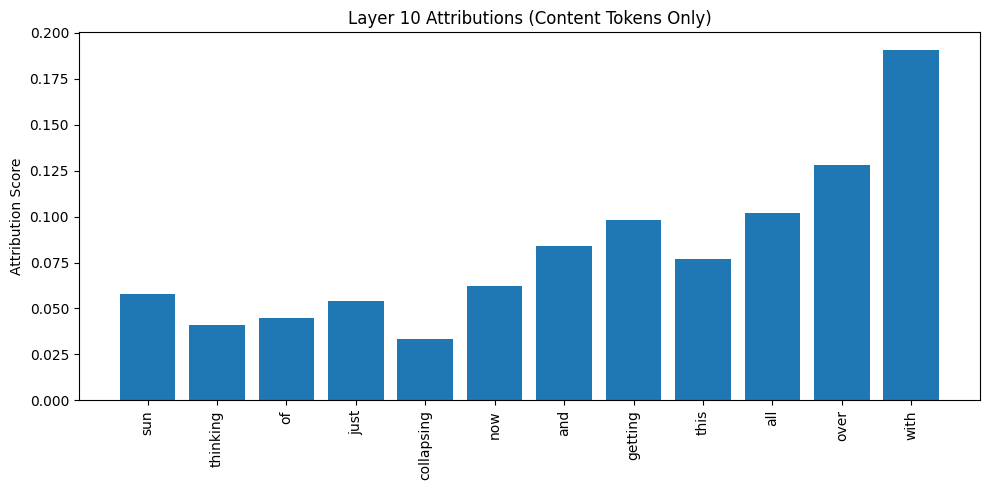

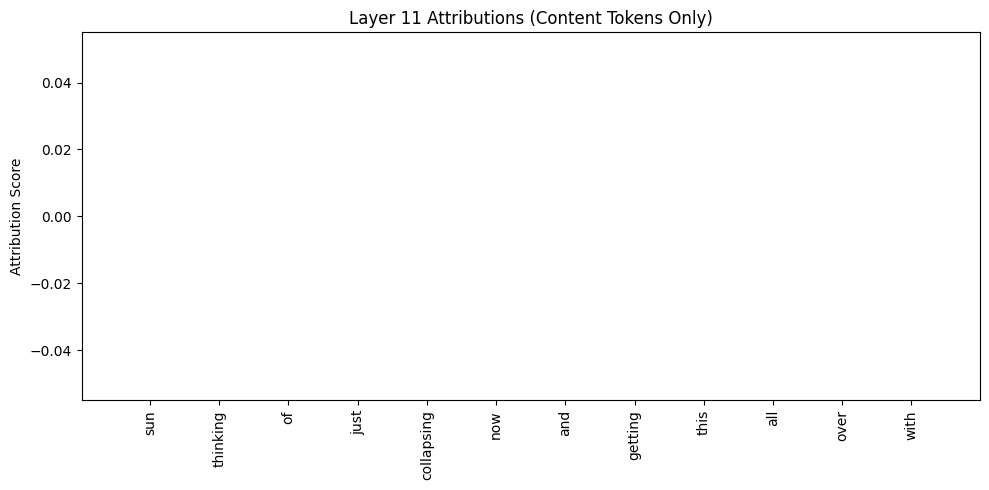

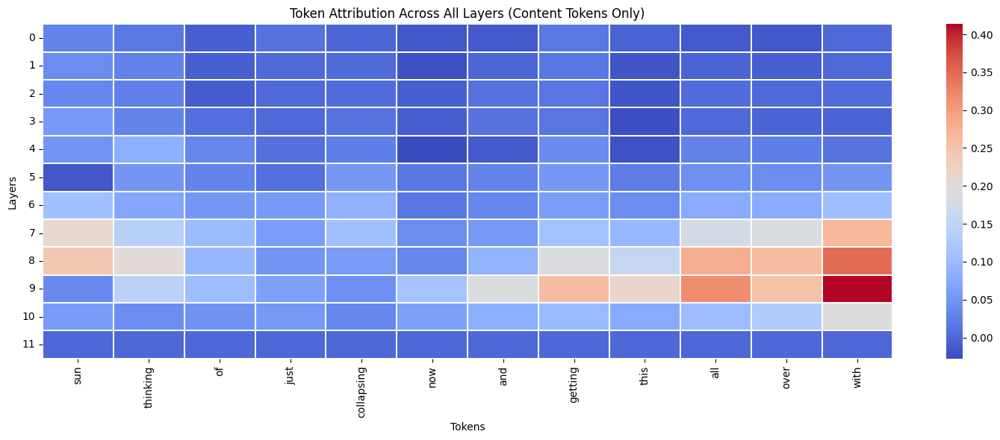

(array([[ 2.91926507e-02,  1.74109209e-02, -7.81992450e-03,
          1.14960279e-02, -1.53952671e-04, -1.57743096e-02,
         -1.22006452e-02,  1.73505843e-02, -3.61134531e-03,
         -1.32934656e-02, -1.60095729e-02,  2.32686382e-03],
        [ 3.99784446e-02,  2.91238446e-02, -7.49207987e-03,
          2.10297201e-03,  4.29444714e-03, -2.39900425e-02,
         -8.12639191e-04,  1.67386215e-02, -1.77757572e-02,
         -2.51284265e-03, -9.58753098e-03,  1.65096798e-03],
        [ 3.34166586e-02,  2.67293025e-02, -1.19630042e-02,
          3.16791143e-03,  5.50612062e-03, -7.25155277e-03,
          1.08942976e-02,  1.53269963e-02, -1.78254768e-02,
          5.46007929e-03,  2.81511899e-03,  5.21427533e-03],
        [ 5.58053255e-02,  2.94729825e-02,  6.98272139e-03,
          3.17192031e-03,  1.35583356e-02, -9.07977019e-03,
          1.07914917e-02,  1.44604454e-02, -2.44250074e-02,
          1.93683093e-03, -2.56665121e-03, -2.43567349e-03],
        [ 4.86824028e-02,  8.3942778

In [ ]:
text = "sun thinking of just collapsing now and getting this all over with"
analyze_sample(text, label=1)
analyze_all_layers(text)

In [ ]:
def explain_using_IG(text, label=None):
    """Analyze a single text sample and visualize attributions"""
    # Prepare inputs
    input_ids, ref_input_ids, token_type_ids, ref_token_type_ids, attention_mask, text_ids = construct_input_ref_pair(text, tokenizer, device)

    # Get tokens for visualization
    tokens = tokenizer.convert_ids_to_tokens(input_ids[0])

    obj = {"text": text}
    # Get model prediction
    with torch.no_grad():
        outputs = model(input_ids, token_type_ids=token_type_ids, attention_mask=attention_mask)
        if hasattr(outputs, 'logits'):
            logits = outputs.logits
        else:
            logits = outputs

        probs = torch.nn.functional.softmax(logits, dim=-1)
        pred_class = torch.argmax(probs, dim=-1).item()
        class_name = "Sarcastic" if pred_class == 1 else "Not sarcastic"
        obj["prediction"] = class_name

    # Initialize LayerIntegratedGradients
    lig = LayerIntegratedGradients(sarcasm_forward_func, model.bert.embeddings)

    # Compute attributions
    attributions, delta = lig.attribute(
        inputs=input_ids,
        baselines=ref_input_ids,
        additional_forward_args=(token_type_ids, None, attention_mask),
        return_convergence_delta=True
    )


    # Summarize attributions
    attributions_sum = summarize_attributions(attributions)
    #print(attributions_sum)
    attributions_sum_array = attributions_sum.cpu().detach().numpy().tolist()
    #print(attributions_sum_array)
    tokens = tokenizer.convert_ids_to_tokens(input_ids[0])
    #print(tokens)
    exps = []
    for weight, token in zip(attributions_sum_array, tokens):
        exps.append({"token": token, "weight": weight})
    obj["explanation"] = exps
    #print(obj)
    return obj


explain_using_IG(sarcastic_samples[0])


NameError: name 'sarcastic_samples' is not defined

# Validation

In [ ]:
def load_validation_data(sarcastic_file="/content/val_random_sarcastic.txt"):
    data = []
    with open(sarcastic_file, 'r') as f:
        for line in f:
            headline = line.strip()
            if headline:
                data.append(headline)  # 1 for sarcastic

    return data
val_texts = load_validation_data()

In [ ]:
import json
def save_as(data,name):
  with open(f"/content/drive/MyDrive/cs4248/{name}.json", 'w') as f:
    json.dump(data, f, indent=4)
temp = [explain_using_IG(text) for text in sarcastic_samples]
save_as(temp,"temp")

In [ ]:
explain_using_ig = []

for i in range (len(val_texts)):
  print(f"explaining {val_texts[i]} {i}/50")
  explain_using_ig.append(explain_using_IG(val_texts[i]))
save_as(explain_using_ig, "explain_using_ig")

explaining mom thought nfl's first openly gay player should have been drafted earlier 0/50
explaining banana republic announces opening of new stores where buying pants will not be totally humiliating experience 1/50
explaining local tcby has missed past 2 logo changes 2/50
explaining vince gilligan's brain spoils final season of 'breaking bad' for vince gilligan 3/50
explaining area man good for the economy 4/50
explaining darfur, ia also in pretty bad shape 5/50
explaining sausage storm grounds nation's airliners 6/50
explaining contrarian amazon user completely upends critical consensus on microfiber towels 7/50
explaining u.s. border collie rounds up 11 million illegal immigrants 8/50
explaining monster truck escapes 9/50
explaining mom loved 'fruitvale station' 10/50
explaining gop establishment relieved after conventionally abhorrent beliefs make way onto presidential ticket 11/50
explaining sun thinking of just collapsing now and getting this all over with 12/50
explaining optim

In [ ]:
explain_with_lime_results = []
for i in range (len(val_texts)):
  print(f"explaining {val_texts[i]} {i}/50")
  explain_with_lime_results.append(explain_using_lime(val_texts[i]))
save_as(explain_with_lime_results, "explain_using_lime")

explaining mom thought nfl's first openly gay player should have been drafted earlier 0/50
Explanation:
explaining banana republic announces opening of new stores where buying pants will not be totally humiliating experience 1/50
Explanation:
explaining local tcby has missed past 2 logo changes 2/50
Explanation:
explaining vince gilligan's brain spoils final season of 'breaking bad' for vince gilligan 3/50
Explanation:
explaining area man good for the economy 4/50
Explanation:
explaining darfur, ia also in pretty bad shape 5/50
Explanation:
explaining sausage storm grounds nation's airliners 6/50
Explanation:
explaining contrarian amazon user completely upends critical consensus on microfiber towels 7/50
Explanation:
explaining u.s. border collie rounds up 11 million illegal immigrants 8/50
Explanation:
explaining monster truck escapes 9/50
Explanation:
explaining mom loved 'fruitvale station' 10/50
Explanation:
explaining gop establishment relieved after conventionally abhorrent belie

In [ ]:
explain_with_tcav_results = []
for i in range (len(val_texts)):
  print(f"explaining {val_texts[i]} {i}/50")
  explain_with_tcav_results.append(explain_with_tcav(val_texts[i]))
save_as(explain_with_tcav_results, "explain_using_tcav")

explaining mom thought nfl's first openly gay player should have been drafted earlier 0/50
explaining banana republic announces opening of new stores where buying pants will not be totally humiliating experience 1/50
explaining local tcby has missed past 2 logo changes 2/50
explaining vince gilligan's brain spoils final season of 'breaking bad' for vince gilligan 3/50
explaining area man good for the economy 4/50
explaining darfur, ia also in pretty bad shape 5/50
explaining sausage storm grounds nation's airliners 6/50
explaining contrarian amazon user completely upends critical consensus on microfiber towels 7/50
explaining u.s. border collie rounds up 11 million illegal immigrants 8/50
explaining monster truck escapes 9/50
explaining mom loved 'fruitvale station' 10/50
explaining gop establishment relieved after conventionally abhorrent beliefs make way onto presidential ticket 11/50
explaining sun thinking of just collapsing now and getting this all over with 12/50
explaining optim